In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%matplotlib notebook

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyFish
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from tqdm import tqdm
import pickle

In [23]:
fn = lambda t,a,b,c: a*np.exp((-1/b)*t) + c

In [24]:
autocorr = pyFish.AutoCorrelation(fft=True)

In [25]:
metrics = pyFish.metrics()

In [26]:
def save_data(Mx, My, f_name, N=16, t_int=0.12):
    max_dt = autocorr._get_autocorr_time(Mx**2 + My**2)
    data_dict = dict()
    for n in tqdm(range(1, N+1), desc='Generating data'):
        if int((n/N)*max_dt) < 1:
            continue
        ch = pyFish.Characterize([Mx, My], t=None, t_int=t_int, dt=int((n/N)*max_dt))
        data_dict[int((n/N)*max_dt)] = ch.data()
    with open(f_name, 'wb') as handle:
        pickle.dump(data_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [27]:
def slider(Mx, My, N=16, t_int=0.12, data_file=None):
    if data_file is None:
        max_dt = autocorr._get_autocorr_time(Mx**2 + My**2)
        data_dict = dict()
        for n in tqdm(range(1, N+1), desc='Generating data'):
            if int((n/N)*max_dt) < 1:
                continue
            ch = pyFish.Characterize([Mx, My], t=None, t_int=t_int, dt=int((n/N)*max_dt))
            data_dict[int((n/N)*max_dt)] = ch.data()
    else:
        with open(data_file, 'rb') as handle:
            data_dict = pickle.load(handle)

    fig = make_subplots(rows=2, cols=2,
                        specs=[[{'is_3d': True}, {'is_3d': True}],
                               [{'is_3d': True}, {'is_3d': True}]],
                        print_grid=False, subplot_titles=('driftX','driftY','diffX','diffY'),
                       horizontal_spacing=0.01,
                       vertical_spacing=0.05,)
    op_x, op_y = np.arange(-1,1,0.1), np.arange(-1,1,0.1)
    x, y = np.meshgrid(op_x, op_y)
    n = ['driftX', 'driftY', 'diffX', 'diffY']

    flag = 1
    for dt in data_dict:
        data = data_dict[dt]
        visible = 'legendonly'
        if flag:
            visible = True
        k = 0
        for r in range(1,3):
            for c in range(1,3):
                marker_colour = 'blue'
                if k%2: marker_colour = 'red'
                fig.append_trace(
                    go.Scatter3d(
                        x=(x.flatten()),
                        y=(y.flatten()),
                        z=(data[k].flatten()),
                        opacity=0.8,
                        mode='markers',
                        marker=dict(size=3,color=marker_colour),
                        name="{}, {}".format(n[k], dt),visible=visible),
                    row=r, col=c,)
                k = k + 1
        flag = 0


    scene = dict(xaxis = dict(showbackground=True),
                    yaxis = dict(showbackground=True),
                    zaxis = dict(showbackground=True,),
                    xaxis_title='mx',
                    yaxis_title='my',
                    zaxis_title='Z',)

    fig.update_layout(
        autosize=False,
        scene_aspectmode='cube',
        scene1 = scene,
        scene2 = scene,
        scene3 = scene,
        scene4 = scene,
        title_text='3D subplots',
        height=800,
        width=800,
    )

    dt_s = list(data_dict.keys())
    steps = []
    for i in range(len(data_dict)):
        step = dict(
            method = 'update',  
            #args = ['visible', ['legendonly'] * len(fig.data),],
            args=[{"visible": [False] * len(fig.data)},
                  {"title": "Slider switched to dt = " + str(dt_s[i])}],  # layout attribute
        )
        #step['args'][0][i*4:i*4+4] = [True for j in range(4)]
        step['args'][0]['visible'][i*4:i*4+4] = [True for j in range(4)]
        steps.append(step)

    sliders = [dict(
        currentvalue={"prefix": "dt: "},
        steps = steps,
    )]

    fig.layout.sliders = sliders

    return fig

In [28]:
def trim_data(Mx, My, trim_percent=0.3, n_parts=4, seed=1, random=False):
    Mx_trim, My_trim = Mx.copy(), My.copy()
    if seed is not None:
        np.random.seed(1)
    if random:
        idx = np.random.randint(0, len(Mx), size=int(len(Mx)* trim_percent))
        Mx_trim[idx] = np.nan
        My_trim[idx] = np.nan
        return Mx_trim, My_trim, Mx_trim**2 + My_trim**2
    buff = int((len(Mx)*trim_percent)/n_parts)
    for i in range(n_parts):
        if not i:
            r = np.random.randint(0, len(Mx)-buff)
        while True:
            r_ = np.random.randint(0, len(Mx))
            if r not in range(r_, r_+buff):
                r = r_
                break
        Mx_trim[r:r+buff] = np.nan
        My_trim[r:r+buff] = np.nan
    return Mx_trim, My_trim, Mx_trim**2 + My_trim**2

In [29]:
def nan_acf(x, t_lag=1000):
    c = []
    mue = np.nanmean(x)
    c.append((np.nanmean((x-mue)*(x-mue)))/np.nanvar(x-mue))
    for i in tqdm(range(1, t_lag)):
        c.append((np.nanmean((x[:-i] - mue)*(x[i:] - mue)))/(np.sqrt(np.nanvar(x[:-i])*np.nanvar((x[i:])))))
    return np.arange(t_lag), np.array(c)

In [30]:
def plot_acf(X, title=None, nan=False):
    if nan:
        print('NaN')
        t, acf = nan_acf(X)
    else:
        print('Nfft')
        t, acf = autocorr._acf(X, 1000)
    coeff1, coeff2 = autocorr._fit_exp(t, acf)
    a,b,c = coeff1
    f = plt.figure()
    plt.plot(t, acf, label='acf')
    plt.plot(t, fn(t,a,b,c), label='exp_fit')
    if title:
        plt.title("{}, autocorr time = {}".format(title, np.ceil(b)))
    plt.legend()
    print(b)
    return f

In [11]:
Mx_2, My_2 = np.loadtxt('syn_pairwise.txt').T
Mx_3, My_3 = np.loadtxt('syn_ternary.txt').T

In [12]:
M_2 = Mx_2**2 + My_2**2
M_3 = Mx_3**2 + My_3**2

In [13]:
len(M_2[:-0])

0

In [14]:
len(M_2[:-1]), len(M_2[1:])

(625046, 625046)

# Pairwise

Nfft
13.332352131359912


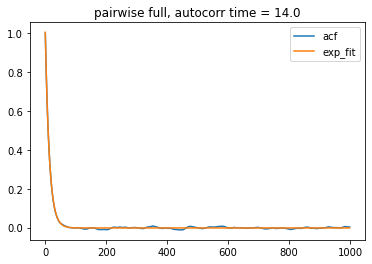

In [40]:
f = plot_acf(M_2, title='pairwise full')

NaN


100%|██████████| 999/999 [00:13<00:00, 73.37it/s]


13.332352161665918


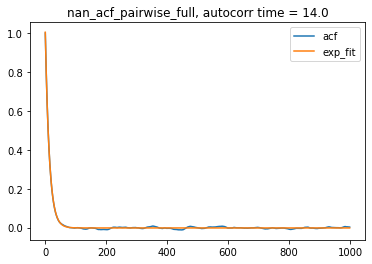

In [16]:
f = plot_acf(M_2, title='nan_acf_pairwise_full', nan=True)

In [28]:
ch_2_full = pyFish.Characterize([Mx_2, My_2], t=None, t_int=0.12)
ch_2_full.parameters()

{'dt_': 'auto',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '13.330889514008469',
 'dt': '13',
 'gaussian_noise': 'True',
 'k': '-1.4112014804951896',
 'l_lim': '-216.04600642928284',
 'h_lim': '194.90905023124333'}

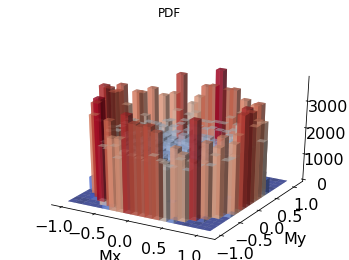

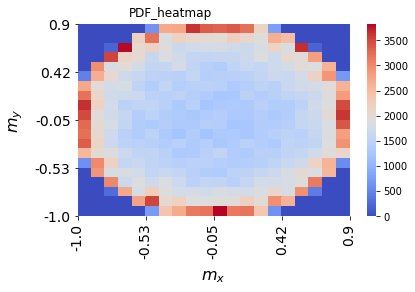

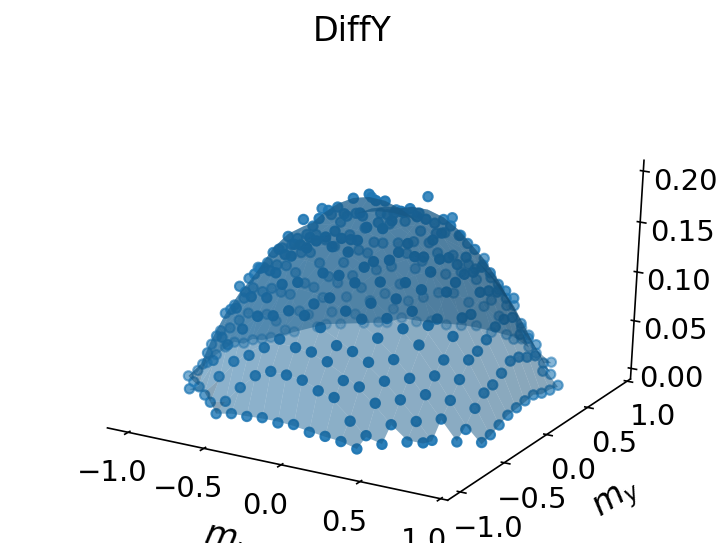

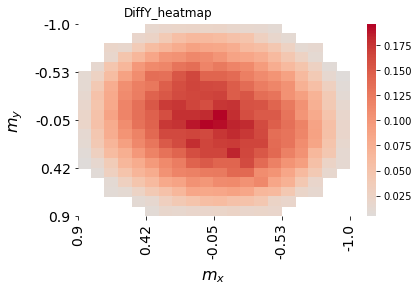

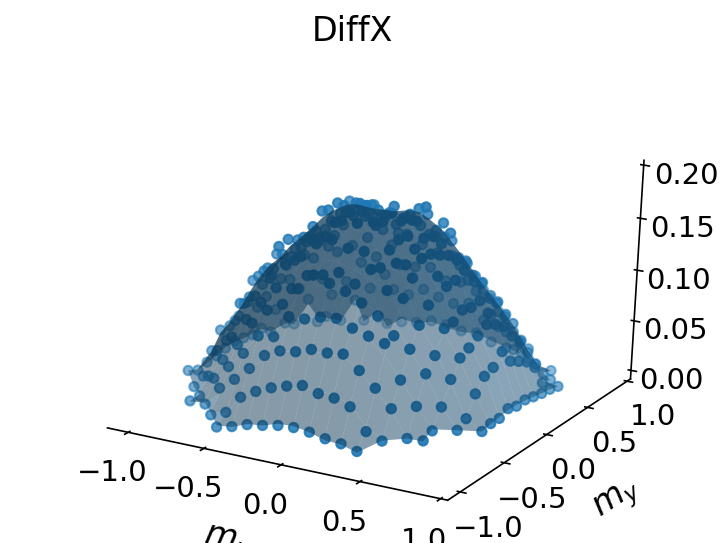

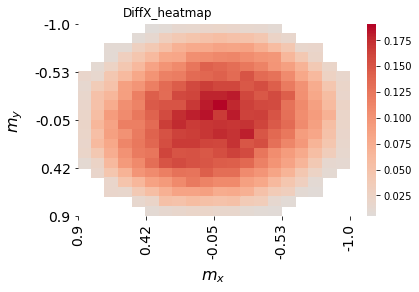

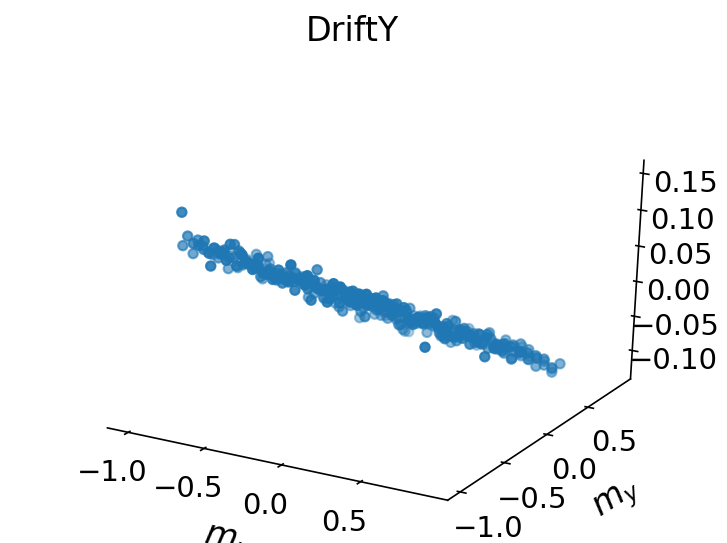

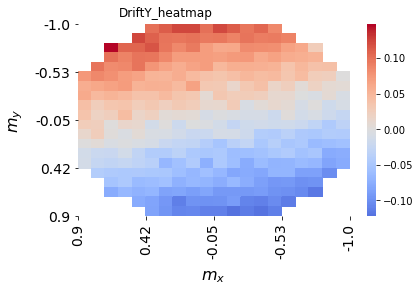

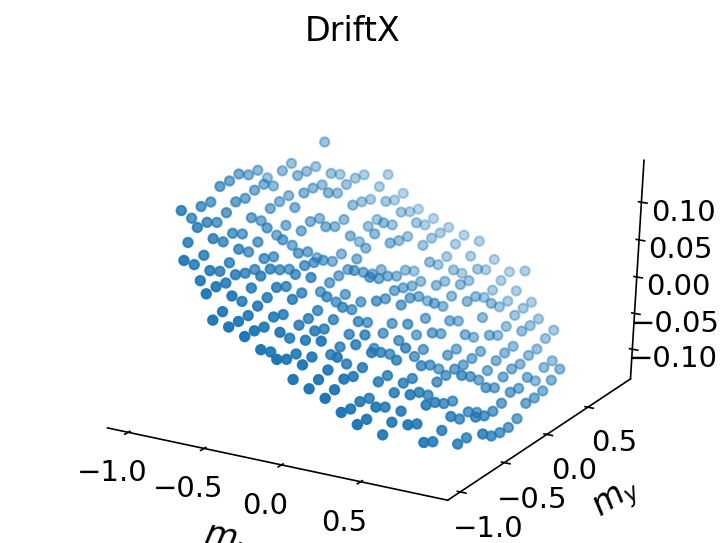

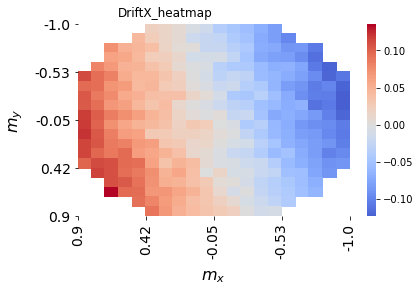

In [29]:
ch_2_full.visualize()

In [42]:
s_2 = slider(Mx_2, My_2, data_file='slider_data_parwise.pkl')
s_2

In [17]:
Mx_trim_2, My_trim_2, M_trim_2 = trim_data(Mx_2, My_2,n_parts=10)
len(Mx_trim_2[np.isnan(Mx_trim_2)])/len(Mx_trim_2)

0.2707812372509587

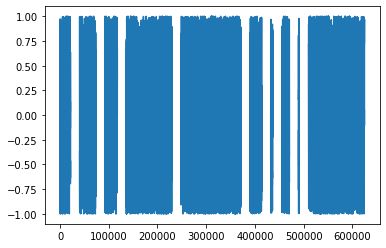

In [18]:
plt.figure()
plt.plot(Mx_trim_2)
plt.show()

  1%|          | 6/999 [00:00<00:19, 51.68it/s]

Nfft
Missing values in time series


100%|██████████| 999/999 [00:13<00:00, 72.82it/s]


13.286624191061861


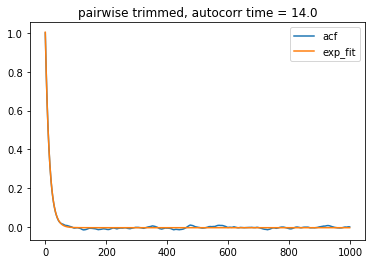

In [31]:
f = plot_acf(M_trim_2, title='pairwise trimmed')

  1%|          | 6/999 [00:00<00:19, 51.30it/s]

NaN


100%|██████████| 999/999 [00:13<00:00, 73.09it/s]


13.286624191061861


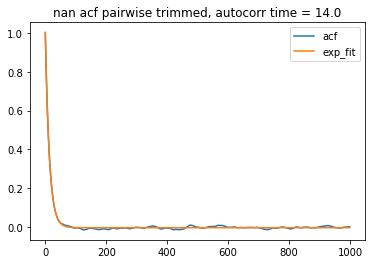

In [20]:
f = plot_acf(M_trim_2, title='nan acf pairwise trimmed', nan=True)

In [37]:
ch_2_trim = pyFish.Characterize([Mx_trim_2, My_trim_2], t=None, t_int=0.12)
ch_2_trim.parameters()

{'dt_': 'auto',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '12.13610303680106',
 'dt': '12',
 'gaussian_noise': 'True',
 'k': '-8.064162784088627',
 'l_lim': '-168.36110396036716',
 'h_lim': '138.7766073979626'}

In [ ]:
ch_2_trim.visualize()

In [50]:
#save_data(Mx_trim_2, My_trim_2, f_name='slider_data_pairwise_trim.pkl')

In [55]:
s_trim_2 = slider(Mx_trim_2, My_trim_2, N=16)

Generating data: 100%|██████████| 16/16 [02:51<00:00, 10.74s/it]


In [56]:
s_trim_2

In [32]:
Mx_trim_2_r, My_trim_2_r, M_trim_2_r = trim_data(Mx_2, My_2, random=True, trim_percent=0.5)

In [33]:
len(Mx_trim_2_r[np.isnan(Mx_trim_2_r)])/len(Mx_trim_2_r)

0.39308244020049693

  0%|          | 3/999 [00:00<00:37, 26.83it/s]

Nfft


100%|██████████| 999/999 [00:28<00:00, 35.46it/s]


13.362454903027638


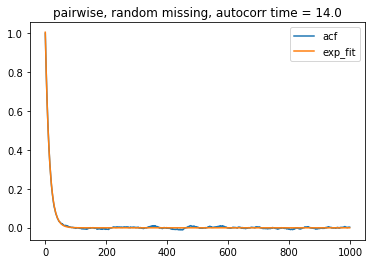

In [34]:
f = plot_acf(M_trim_2_r, title='pairwise, random missing')

  0%|          | 0/999 [00:00<?, ?it/s]

NaN


100%|██████████| 999/999 [00:28<00:00, 35.59it/s]


13.362454903027638


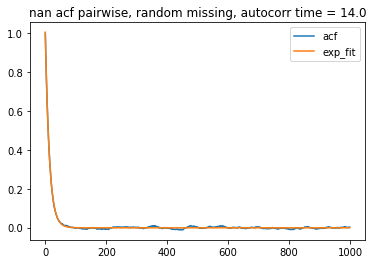

In [35]:
f = plot_acf(M_trim_2_r, title='nan acf pairwise, random missing', nan=True)

# Ternary

Nfft
35.46209699533565


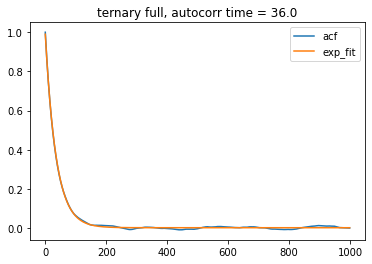

In [41]:
f = plot_acf(M_3, title='ternary full')

  0%|          | 0/999 [00:00<?, ?it/s]

NaN


100%|██████████| 999/999 [00:11<00:00, 85.82it/s]


35.46209619762686


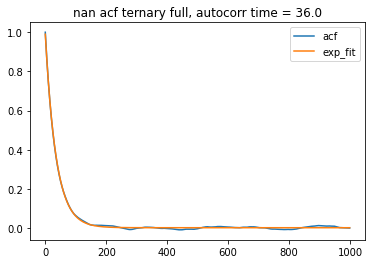

In [42]:
f = plot_acf(M_3, title='nan acf ternary full', nan=True)

In [44]:
ch_3_full = pyFish.Characterize([Mx_3, My_3], t=None, t_int=0.12, dt=3)
ch_3_full.parameters()

{'dt_': '3',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '1',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '35.45905562757836',
 'dt': '3',
 'gaussian_noise': 'True',
 'k': '2.915939488087529',
 'l_lim': '-142.5599333575513',
 'h_lim': '165.42309272793727'}

In [ ]:
ch_3_full.visualize()

In [25]:
s_3 = slider(Mx_3, My_3, N=16)
s_3

Generating data: 100%|██████████| 16/16 [03:48<00:00, 14.27s/it]


In [43]:
Mx_trim_3, My_trim_3, M_trim_3 = trim_data(Mx_3, My_3,trim_percent=0.6, n_parts=8)

In [44]:
len(M_trim_3[np.isnan(M_trim_3)])/len(M_trim_3)

0.5628817562682055

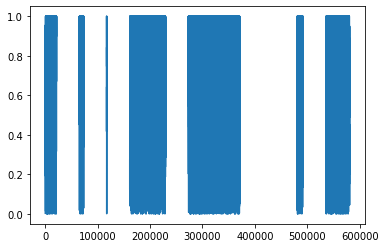

In [45]:
plt.figure()
plt.plot(M_trim_3)
plt.show()

  1%|          | 5/999 [00:00<00:20, 49.05it/s]

Nfft


100%|██████████| 999/999 [00:13<00:00, 73.39it/s]


34.56574318963067


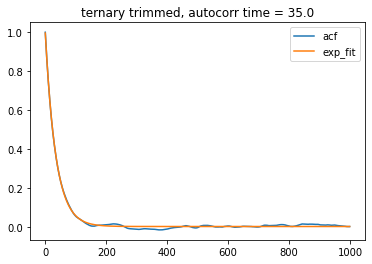

In [46]:
f = plot_acf(M_trim_3, title='ternary trimmed')

  1%|          | 6/999 [00:00<00:18, 54.69it/s]

NaN


100%|██████████| 999/999 [00:13<00:00, 74.27it/s]


34.56574318963067


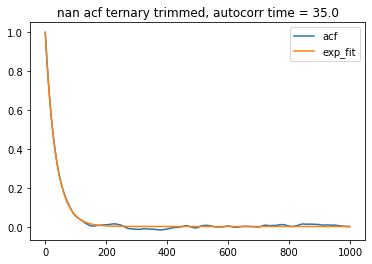

In [47]:
f = plot_acf(M_trim_3, title='nan acf ternary trimmed', nan=True)

In [50]:
ch_3_trim = pyFish.Characterize([Mx_trim_3, My_trim_3], t=None, t_int=0.12, dt=3)
ch_3_trim.parameters()

{'dt_': '3',
 't_int': '0.12',
 't_lag': '1000',
 'simple_method': 'True',
 'max_order': '10',
 'inc': '0.01',
 'inc_x': '0.1',
 'inc_y': '0.1',
 'delta_t': '1',
 'order_metric': 'R2_adj',
 'fft': 'True',
 'drift_order': '3',
 'diff_order': '2',
 'n_trials': '1',
 'vector': 'True',
 'autocorrelation_time': '29.073695018429408',
 'dt': '3',
 'gaussian_noise': 'True',
 'k': '3.3380962130646594',
 'l_lim': '-123.7927951311541',
 'h_lim': '128.28378838799154'}

In [ ]:
ch_3_trim.visualize()

In [49]:
#save_data(Mx_trim_3, My_trim_3, f_name='slider_data_ternary_trim.pkl')

In [31]:
s_trim_3 = slider(Mx_trim_3, My_trim_3, N=16)
s_trim_3

Generating data: 100%|██████████| 16/16 [03:28<00:00, 13.05s/it]


In [48]:
Mx_trim_3_r, My_trim_3_r, M_trim_3_r = trim_data(Mx_3, My_3, random=True, trim_percent=0.6)

In [49]:
len(M_trim_3_r[np.isnan(M_trim_3_r)])/len(M_trim_3_r)

0.4508993437407466

  0%|          | 3/999 [00:00<00:35, 27.68it/s]

Nfft


100%|██████████| 999/999 [00:26<00:00, 37.17it/s]


35.75380060725235


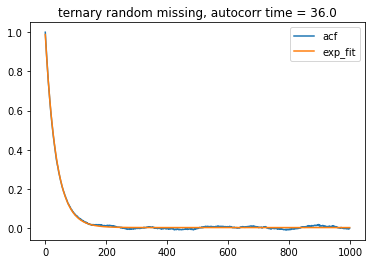

In [50]:
f = plot_acf(M_trim_3_r, title='ternary random missing')

  0%|          | 0/999 [00:00<?, ?it/s]

NaN


100%|██████████| 999/999 [00:29<00:00, 34.41it/s]


35.75380060725235


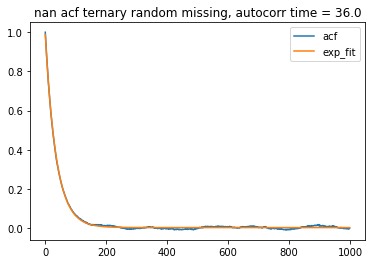

In [51]:
f = plot_acf(M_trim_3_r, title='nan acf ternary random missing', nan=True)